# Government720 Interpolation and Extrapolation
This notebook is for filling in the gaps between the missing data using interpolation and extrapolation. Each imputed dataset is then exported as a new dataset to be used for generating the synthetic data later on.

### CLIENT 1: ECONOMY

In [1]:
# Import pandas
import pandas as pd

# Access Google Drive for Excel file
from google.colab import drive
drive.mount('/content/drive')

# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT1_ECONOMY', engine='openpyxl')

# Display the first few rows
print(df.head())

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
              DATE  UNEMPLOYMENT_RATE  INFLATION_RATE   GDP  HOUSING_AFFORD  \
0  Week-1-Jan-2000                NaN             2.7  10.0             NaN   
1  Week-2-Jan-2000                NaN             NaN   NaN             NaN   
2  Week-3-Jan-2000                NaN             NaN   NaN             NaN   
3  Week-4-Jan-2000                NaN             NaN   NaN             NaN   
4  Week-1-Feb-2000                NaN             3.2   NaN             NaN   

   MIN_WAGE  POVERTY_WAGE  GENDER_GAP  RACIAL_GAP  DEFICIT  ...  PAYROLL_TAX  \
0      5.15           8.4        22.7        19.2      NaN  ...         3.93   
1       NaN           NaN         NaN         NaN      NaN  ...          NaN   
2       NaN           NaN         NaN         NaN      NaN  ...          NaN   
3       NaN           NaN         NaN         NaN      NaN  ...          NaN

In [2]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  UNEMPLOYMENT_RATE  INFLATION_RATE   GDP  HOUSING_AFFORD  \
0 2000-01-01                NaN             2.7  10.0             NaN   
1 2000-01-02                NaN             NaN   NaN             NaN   
2 2000-01-03                NaN             NaN   NaN             NaN   
3 2000-01-04                NaN             NaN   NaN             NaN   
4 2000-02-01                NaN             3.2   NaN             NaN   

   MIN_WAGE  POVERTY_WAGE  GENDER_GAP  RACIAL_GAP  DEFICIT  ...  PAYROLL_TAX  \
0      5.15           8.4        22.7        19.2      NaN  ...         3.93   
1       NaN           NaN         NaN         NaN      NaN  ...          NaN   
2       NaN           NaN         NaN         NaN      NaN  ...          NaN   
3       NaN           NaN         NaN         NaN      NaN  ...          NaN   
4       NaN           NaN         NaN         NaN      NaN  ...          NaN   

   CORPORATE_TAX  CORPORATE_PROFIT  TOP1_WEALTH  FICO_SCORE  \
0           1.24 

In [3]:
# Display data types of all columns in the DataFrame
print(df.dtypes)

# Convert 'CORPORATE_PROFIT' column from object to float64
df['CORPORATE_PROFIT'] = pd.to_numeric(df['CORPORATE_PROFIT'], errors='coerce')

# Verify the change
print(df['CORPORATE_PROFIT'].dtype)

DATE                     datetime64[ns]
UNEMPLOYMENT_RATE               float64
INFLATION_RATE                  float64
GDP                             float64
HOUSING_AFFORD                  float64
MIN_WAGE                        float64
POVERTY_WAGE                    float64
GENDER_GAP                      float64
RACIAL_GAP                      float64
DEFICIT                         float64
SS_RECIPIENTS                   float64
CPI                             float64
MEDIAN_WAGE                     float64
MANU_JOBS                       float64
UNION_MEMBERS                   float64
JOBS_ADDED                      float64
POVERTY_RATE                    float64
FED_EMPLOY                      float64
GAO_HIGH_RISK                   float64
INCOME_TAX                      float64
PAYROLL_TAX                     float64
CORPORATE_TAX                   float64
CORPORATE_PROFIT                 object
TOP1_WEALTH                     float64
FICO_SCORE                      float64


In [4]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both')

# Display the first few rows after interpolation
print(df_interpolated.head())

   UNEMPLOYMENT_RATE  INFLATION_RATE        GDP  HOUSING_AFFORD  MIN_WAGE  \
0                NaN        2.700000  10.000000             NaN      5.15   
1                NaN        2.817597  10.009615             NaN      5.15   
2                NaN        2.942758  10.019231             NaN      5.15   
3                NaN        3.071540  10.028846             NaN      5.15   
4                NaN        3.200000  10.038462             NaN      5.15   

   POVERTY_WAGE  GENDER_GAP  RACIAL_GAP  DEFICIT  SS_RECIPIENTS  ...  \
0      8.400000   22.700000   19.200000      NaN   4.541470e+07  ...   
1      8.405275   22.702733   19.243111      NaN   4.542261e+07  ...   
2      8.410523   22.705164   19.285909      NaN   4.543054e+07  ...   
3      8.415744   22.707295   19.328403      NaN   4.543848e+07  ...   
4      8.420937   22.709130   19.370601      NaN   4.544644e+07  ...   

   PAYROLL_TAX  CORPORATE_TAX  CORPORATE_PROFIT  TOP1_WEALTH  FICO_SCORE  \
0     3.930000       1.24000

In [5]:
nan_columns = df_interpolated.columns[df_interpolated.isna().any()]
print(nan_columns)

Index(['UNEMPLOYMENT_RATE', 'INFLATION_RATE', 'GDP', 'HOUSING_AFFORD',
       'MIN_WAGE', 'POVERTY_WAGE', 'GENDER_GAP', 'RACIAL_GAP', 'DEFICIT',
       'SS_RECIPIENTS', 'CPI', 'MEDIAN_WAGE', 'MANU_JOBS', 'UNION_MEMBERS',
       'POVERTY_RATE', 'FED_EMPLOY', 'GAO_HIGH_RISK', 'INCOME_TAX',
       'PAYROLL_TAX', 'CORPORATE_TAX', 'CORPORATE_PROFIT', 'TOP1_WEALTH',
       'FICO_SCORE', 'UNEMPLOY_PER_JOB_OPEN', 'LABOR_PART_RATE', 'LAYOFF_RATE',
       'CHILDCARE_COST', 'TEACHER_PAY'],
      dtype='object')


In [6]:
# Import packages
from sklearn.linear_model import LinearRegression
import numpy as np

# Function to perform linear regression extrapolation
def linear_extrapolate(col):
    col = col.copy()
    n = len(col)

    # Find first and last 156 non-null values (3-year moving average)
    first_156 = col.dropna().iloc[:156]
    last_156 = col.dropna().iloc[-156:]

    # Fit linear regression for beginning extrapolation
    if len(first_156) >= 2:  # Need at least two points for regression
        X_first = first_156.index.values.reshape(-1, 1)
        y_first = first_156.values
        model_first = LinearRegression().fit(X_first, y_first)
        missing_first_indices = np.arange(0, first_156.index[0]).reshape(-1, 1)
        if len(missing_first_indices) > 0:
            col.iloc[:first_156.index[0]] = model_first.predict(missing_first_indices)

    # Fit linear regression for ending extrapolation
    if len(last_156) >= 2:
        X_last = last_156.index.values.reshape(-1, 1)
        y_last = last_156.values
        model_last = LinearRegression().fit(X_last, y_last)
        missing_last_indices = np.arange(last_156.index[-1] + 1, n).reshape(-1, 1)
        if len(missing_last_indices) > 0:
            col.iloc[last_156.index[-1] + 1:] = model_last.predict(missing_last_indices)

    return col

# Apply linear extrapolation where Akima could not extrapolate
df_extrapolated = df_interpolated.apply(linear_extrapolate)

# Display the first few rows after filling missing values
print(df_extrapolated.head())

# Verify null values again
nan_columns = df_extrapolated.columns[df_extrapolated.isna().any()]
print(nan_columns)

   UNEMPLOYMENT_RATE  INFLATION_RATE        GDP  HOUSING_AFFORD  MIN_WAGE  \
0           6.393607        2.700000  10.000000       34.092080      5.15   
1           6.388743        2.817597  10.009615       34.098687      5.15   
2           6.383880        2.942758  10.019231       34.105294      5.15   
3           6.379016        3.071540  10.028846       34.111900      5.15   
4           6.374153        3.200000  10.038462       34.118507      5.15   

   POVERTY_WAGE  GENDER_GAP  RACIAL_GAP   DEFICIT  SS_RECIPIENTS  ...  \
0      8.400000   22.700000   19.200000  0.363724   4.541470e+07  ...   
1      8.405275   22.702733   19.243111  0.357828   4.542261e+07  ...   
2      8.410523   22.705164   19.285909  0.351931   4.543054e+07  ...   
3      8.415744   22.707295   19.328403  0.346035   4.543848e+07  ...   
4      8.420937   22.709130   19.370601  0.340138   4.544644e+07  ...   

   PAYROLL_TAX  CORPORATE_TAX  CORPORATE_PROFIT  TOP1_WEALTH  FICO_SCORE  \
0     3.930000       1

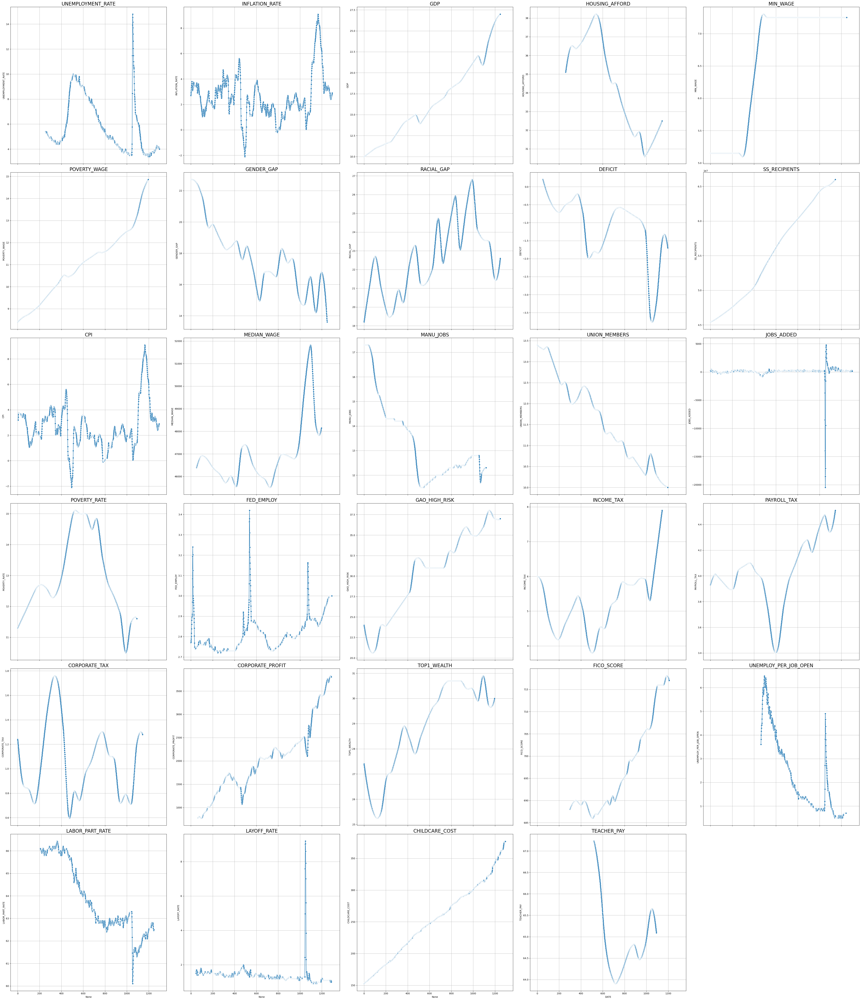

In [7]:
# Make multi-graph chart of numeric time series variables to verify interpolation method is good
# Import packages
import seaborn as sns
import matplotlib.pyplot as plt

# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 2*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

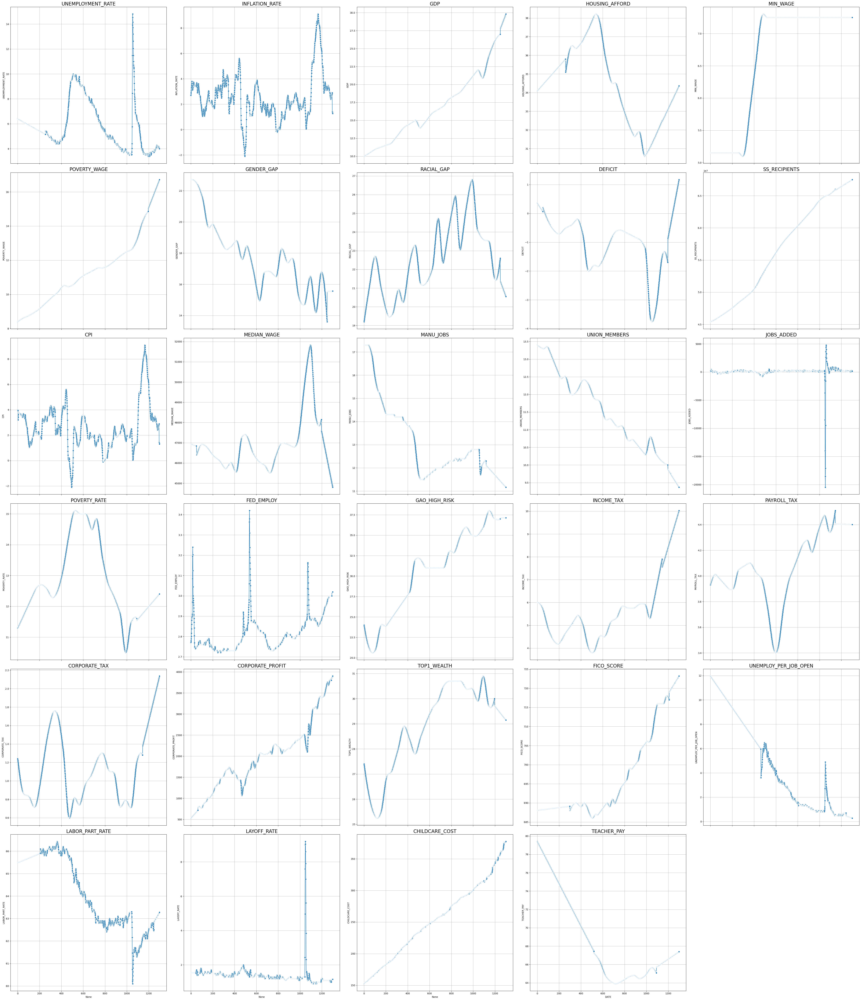

In [8]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 2*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [9]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT1_Interpolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT1_Interpolated.xlsx


### CLIENT 2: MEDIA

In [38]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT2_MEDIA', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  MEDIA_TRUST  FACEBOOK_USE  INSTAGRAM_USE  TWITTER_USE  \
0  Week-1-Jan-2000         55.0           NaN            NaN          NaN   
1  Week-2-Jan-2000          NaN           NaN            NaN          NaN   
2  Week-3-Jan-2000          NaN           NaN            NaN          NaN   
3  Week-4-Jan-2000          NaN           NaN            NaN          NaN   
4  Week-1-Feb-2000          NaN           NaN            NaN          NaN   

   FACT_CHECKERS  MISINFORMATION_MENTIONS  
0            NaN                      NaN  
1            NaN                      NaN  
2            NaN                      NaN  
3            NaN                      NaN  
4            NaN                      NaN  


In [39]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  MEDIA_TRUST  FACEBOOK_USE  INSTAGRAM_USE  TWITTER_USE  \
0 2000-01-01         55.0           NaN            NaN          NaN   
1 2000-01-02          NaN           NaN            NaN          NaN   
2 2000-01-03          NaN           NaN            NaN          NaN   
3 2000-01-04          NaN           NaN            NaN          NaN   
4 2000-02-01          NaN           NaN            NaN          NaN   

   FACT_CHECKERS  MISINFORMATION_MENTIONS  
0            NaN                      NaN  
1            NaN                      NaN  
2            NaN                      NaN  
3            NaN                      NaN  
4            NaN                      NaN  


In [40]:
# Set index 0 of all columns except MEDIA_TRUST to 0
df.loc[0, ['FACEBOOK_USE','INSTAGRAM_USE','TWITTER_USE','FACT_CHECKERS','MISINFORMATION_MENTIONS']] = 0

In [41]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both').clip(lower=0)

# Display the first few rows after interpolation
print(df_interpolated.head())

   MEDIA_TRUST  FACEBOOK_USE  INSTAGRAM_USE  TWITTER_USE  FACT_CHECKERS  \
0    55.000000      0.000000            0.0     0.000000            0.0   
1    54.865717      0.108169            0.0     0.031225            0.0   
2    54.732159      0.216330            0.0     0.062399            0.0   
3    54.599418      0.324482            0.0     0.093523            0.0   
4    54.467586      0.432625            0.0     0.124597            0.0   

   MISINFORMATION_MENTIONS  
0                      0.0  
1                      0.0  
2                      0.0  
3                      0.0  
4                      0.0  


In [42]:
nan_columns = df_interpolated.columns[df_interpolated.isna().any()]
print(nan_columns)

nan_rows = df_interpolated[df_interpolated.isna().any(axis=1)]
print(nan_rows)

Index(['FACEBOOK_USE', 'INSTAGRAM_USE', 'TWITTER_USE', 'FACT_CHECKERS',
       'MISINFORMATION_MENTIONS'],
      dtype='object')
      MEDIA_TRUST  FACEBOOK_USE  INSTAGRAM_USE  TWITTER_USE  FACT_CHECKERS  \
1184    34.461538     68.172309      45.933859    22.212408     423.843464   
1185    34.423077     68.158062      46.020381    22.196064     423.888007   
1186    34.384615     68.143786      46.107331    22.179481     423.927205   
1187    34.346154     68.129484      46.194707    22.162656     423.960946   
1188    34.307692     68.115157      46.282506    22.145588     423.989112   
...           ...           ...            ...          ...            ...   
1295    31.040956           NaN            NaN          NaN            NaN   
1296    31.030641           NaN            NaN          NaN            NaN   
1297    31.020391           NaN            NaN          NaN            NaN   
1298    31.010185           NaN            NaN          NaN            NaN   
1299    31.00

In [43]:
# Function to perform linear regression extrapolation
def linear_extrapolate(col):
    col = col.copy()
    n = len(col)

    # Find first and last 156 non-null values
    first_156 = col.dropna().iloc[:156]
    last_156 = col.dropna().iloc[-156:]

    # Fit linear regression for beginning extrapolation
    if len(first_156) >= 2:  # Need at least two points for regression
        X_first = first_156.index.values.reshape(-1, 1)
        y_first = first_156.values
        model_first = LinearRegression().fit(X_first, y_first)
        missing_first_indices = np.arange(0, first_156.index[0]).reshape(-1, 1)
        if len(missing_first_indices) > 0:
            col.iloc[:first_156.index[0]] = model_first.predict(missing_first_indices)

    # Fit linear regression for ending extrapolation
    if len(last_156) >= 2:
        X_last = last_156.index.values.reshape(-1, 1)
        y_last = last_156.values
        model_last = LinearRegression().fit(X_last, y_last)
        missing_last_indices = np.arange(last_156.index[-1] + 1, n).reshape(-1, 1)
        if len(missing_last_indices) > 0:
            col.iloc[last_156.index[-1] + 1:] = model_last.predict(missing_last_indices)

    return col

# Apply linear extrapolation where Akima could not extrapolate
df_extrapolated = df_interpolated.apply(linear_extrapolate)

# Display the first few rows after filling missing values
print(df_extrapolated.head())

   MEDIA_TRUST  FACEBOOK_USE  INSTAGRAM_USE  TWITTER_USE  FACT_CHECKERS  \
0    55.000000      0.000000            0.0     0.000000            0.0   
1    54.865717      0.108169            0.0     0.031225            0.0   
2    54.732159      0.216330            0.0     0.062399            0.0   
3    54.599418      0.324482            0.0     0.093523            0.0   
4    54.467586      0.432625            0.0     0.124597            0.0   

   MISINFORMATION_MENTIONS  
0                      0.0  
1                      0.0  
2                      0.0  
3                      0.0  
4                      0.0  


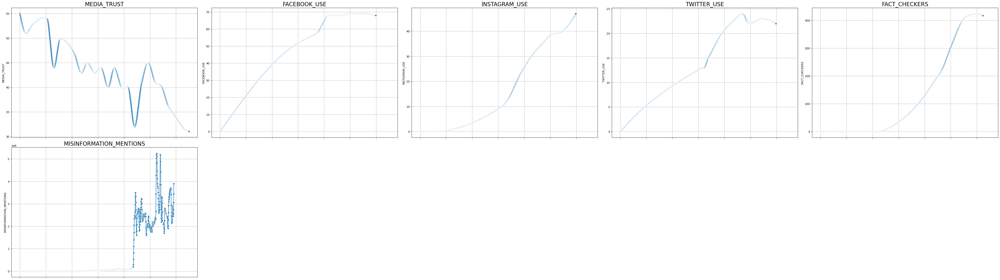

In [44]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

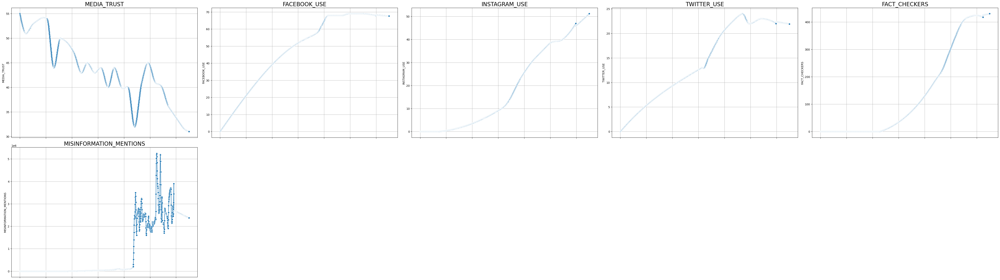

In [45]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [46]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT2_Interpolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT2_Interpolated.xlsx


### CLIENT 3: HEALTH

In [47]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT3_HEALTH', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  GUN_DEATH_RATE  OVERDOSE_DEATH_RATE  HEALTH_INSURANCE  \
0  Week-1-Jan-2000            10.3                  6.1              86.9   
1  Week-2-Jan-2000             NaN                  NaN               NaN   
2  Week-3-Jan-2000             NaN                  NaN               NaN   
3  Week-4-Jan-2000             NaN                  NaN               NaN   
4  Week-1-Feb-2000             NaN                  NaN               NaN   

   SUICIDE  OBESITY_RATE  ABORTIONS  MENTAL_ILLNESS_RATE  OPIOID_DEATHS  \
0     10.4           NaN        NaN                  NaN         8407.0   
1      NaN           NaN        NaN                  NaN            NaN   
2      NaN           NaN        NaN                  NaN            NaN   
3      NaN           NaN        NaN                  NaN            NaN   
4      NaN           NaN        NaN                  NaN            NaN   

   OPIOID_PRESCRIP  ...  ALCOHOL_TREATMENT  OPIOID_TREATMENT  IVF_BABIES  \
0         

In [48]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  GUN_DEATH_RATE  OVERDOSE_DEATH_RATE  HEALTH_INSURANCE  SUICIDE  \
0 2000-01-01            10.3                  6.1              86.9     10.4   
1 2000-01-02             NaN                  NaN               NaN      NaN   
2 2000-01-03             NaN                  NaN               NaN      NaN   
3 2000-01-04             NaN                  NaN               NaN      NaN   
4 2000-02-01             NaN                  NaN               NaN      NaN   

   OBESITY_RATE  ABORTIONS  MENTAL_ILLNESS_RATE  OPIOID_DEATHS  \
0           NaN        NaN                  NaN         8407.0   
1           NaN        NaN                  NaN            NaN   
2           NaN        NaN                  NaN            NaN   
3           NaN        NaN                  NaN            NaN   
4           NaN        NaN                  NaN            NaN   

   OPIOID_PRESCRIP  ...  ALCOHOL_TREATMENT  OPIOID_TREATMENT  IVF_BABIES  \
0              NaN  ...                NaN    

In [49]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both')

# Display the first few rows after interpolation
print(df_interpolated.head())

   GUN_DEATH_RATE  OVERDOSE_DEATH_RATE  HEALTH_INSURANCE    SUICIDE  \
0       10.300000             6.100000         86.900000  10.400000   
1       10.296179             6.097229         86.892308  10.406703   
2       10.292408             6.094683         86.884615  10.413352   
3       10.288690             6.092359         86.876923  10.419947   
4       10.285025             6.090256         86.869231  10.426491   

   OBESITY_RATE  ABORTIONS  MENTAL_ILLNESS_RATE  OPIOID_DEATHS  \
0           NaN        NaN                  NaN    8407.000000   
1           NaN        NaN                  NaN    8415.358725   
2           NaN        NaN                  NaN    8424.222883   
3           NaN        NaN                  NaN    8433.591756   
4           NaN        NaN                  NaN    8443.464627   

   OPIOID_PRESCRIP  FENTANYL_DEATHS  ALCOHOL_TREATMENT  OPIOID_TREATMENT  \
0              NaN       782.000000                NaN               NaN   
1              NaN      

In [50]:
nan_columns = df_interpolated.columns[df_interpolated.isna().any()]
print(nan_columns)

Index(['GUN_DEATH_RATE', 'OVERDOSE_DEATH_RATE', 'HEALTH_INSURANCE', 'SUICIDE',
       'OBESITY_RATE', 'ABORTIONS', 'MENTAL_ILLNESS_RATE', 'OPIOID_DEATHS',
       'OPIOID_PRESCRIP', 'FENTANYL_DEATHS', 'ALCOHOL_TREATMENT',
       'OPIOID_TREATMENT', 'IVF_BABIES', 'VACC_IMPORTANCE', 'DIABETES_RATE',
       'CANCER_SURVIVAL', 'CANCER_INCIDENCE', 'CANCER_MORTALITY',
       'HEART_DISEASE', 'FDA_APPROVALS'],
      dtype='object')


In [51]:
# Function to perform linear regression extrapolation
def linear_extrapolate(col):
    col = col.copy()
    n = len(col)

    # Find first and last 156 non-null values
    first_156 = col.dropna().iloc[:156]
    last_156 = col.dropna().iloc[-156:]

    # Fit linear regression for beginning extrapolation
    if len(first_156) >= 2:  # Need at least two points for regression
        X_first = first_156.index.values.reshape(-1, 1)
        y_first = first_156.values
        model_first = LinearRegression().fit(X_first, y_first)
        missing_first_indices = np.arange(0, first_156.index[0]).reshape(-1, 1)
        if len(missing_first_indices) > 0:
            col.iloc[:first_156.index[0]] = model_first.predict(missing_first_indices)

    # Fit linear regression for ending extrapolation
    if len(last_156) >= 2:
        X_last = last_156.index.values.reshape(-1, 1)
        y_last = last_156.values
        model_last = LinearRegression().fit(X_last, y_last)
        missing_last_indices = np.arange(last_156.index[-1] + 1, n).reshape(-1, 1)
        if len(missing_last_indices) > 0:
            col.iloc[last_156.index[-1] + 1:] = model_last.predict(missing_last_indices)

    return col

# Apply linear extrapolation where Akima could not extrapolate
df_extrapolated = df_interpolated.apply(linear_extrapolate)

# Display the first few rows after filling missing values
print(df_extrapolated.head())

   GUN_DEATH_RATE  OVERDOSE_DEATH_RATE  HEALTH_INSURANCE    SUICIDE  \
0       10.300000             6.100000         86.900000  10.400000   
1       10.296179             6.097229         86.892308  10.406703   
2       10.292408             6.094683         86.884615  10.413352   
3       10.288690             6.092359         86.876923  10.419947   
4       10.285025             6.090256         86.869231  10.426491   

   OBESITY_RATE      ABORTIONS  MENTAL_ILLNESS_RATE  OPIOID_DEATHS  \
0     30.223918  895630.561649            17.913311    8407.000000   
1     30.230878  895296.420814            17.913487    8415.358725   
2     30.237837  894962.279978            17.913664    8424.222883   
3     30.244797  894628.139143            17.913840    8433.591756   
4     30.251756  894293.998308            17.914017    8443.464627   

   OPIOID_PRESCRIP  FENTANYL_DEATHS  ALCOHOL_TREATMENT  OPIOID_TREATMENT  \
0        59.359826       782.000000      574490.312575     219983.067818   


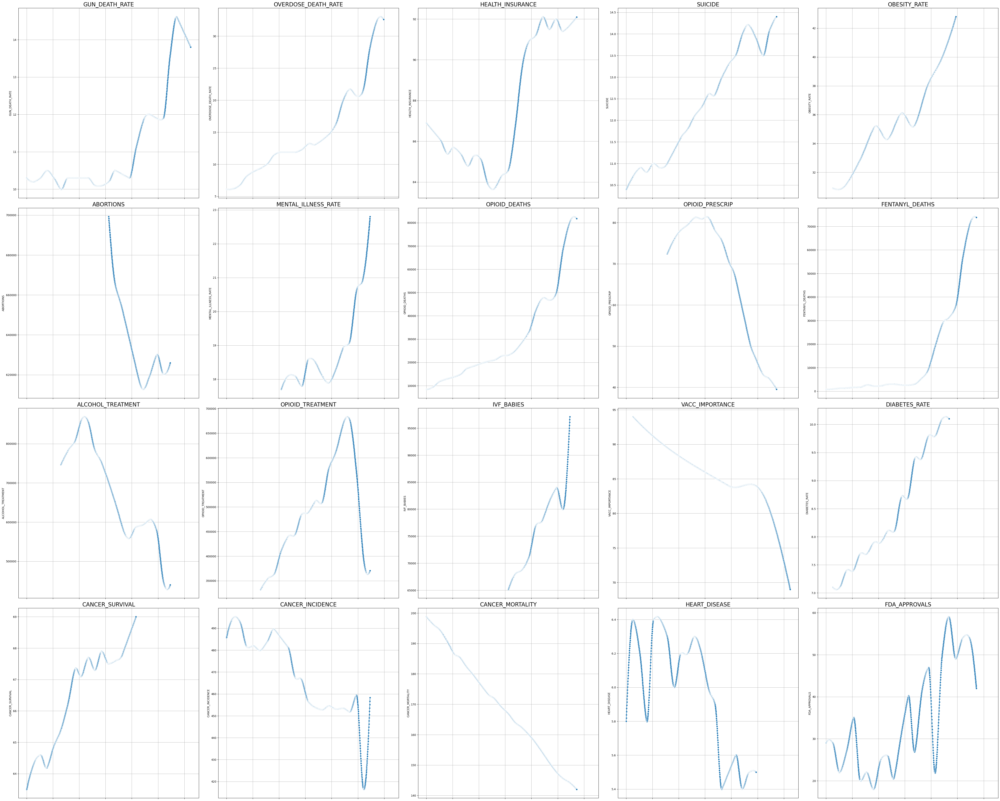

In [54]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 3*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

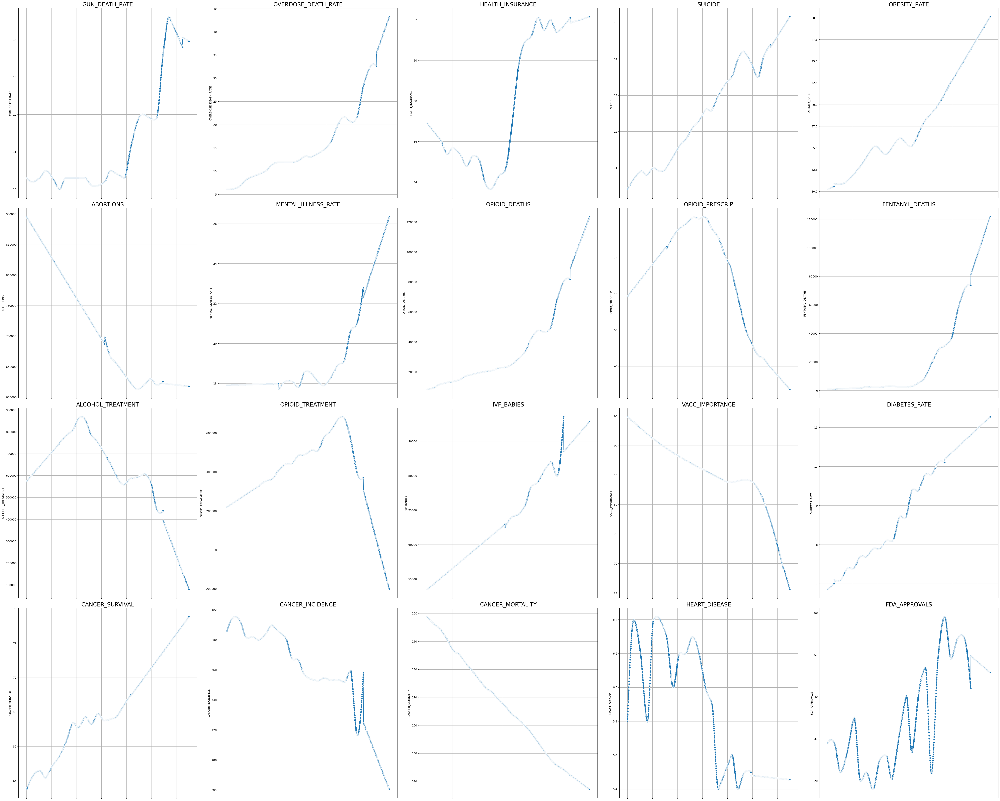

In [55]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 3*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [56]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT3_Interpolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT3_Interpolated.xlsx


### CLIENT 4: ELECTIONS

In [72]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT4_ELECTIONS', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  DARK_MONEY  VOTER_TURNOUT  SUPREME_COURT_APPROVAL  \
0  Week-1-Jan-2000       11.21           53.0                     NaN   
1  Week-2-Jan-2000         NaN            NaN                     NaN   
2  Week-3-Jan-2000         NaN            NaN                     NaN   
3  Week-4-Jan-2000         NaN            NaN                     NaN   
4  Week-1-Feb-2000         NaN            NaN                     NaN   

   CLOTURE_MOTIONS  ENACTED_LEGIS  OFFICIAL_THREATS  PARTISAN_GAP_HOUSE  \
0              NaN            NaN               NaN                 NaN   
1              NaN            NaN               NaN                 NaN   
2              NaN            NaN               NaN                 NaN   
3              NaN            NaN               NaN                 NaN   
4              NaN            NaN               NaN                 NaN   

   PARTISAN_GAP_SENATE  HOUSE_LEANING  SENATE_LEANING  
0                  NaN            NaN             NaN 

In [73]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  DARK_MONEY  VOTER_TURNOUT  SUPREME_COURT_APPROVAL  \
0 2000-01-01       11.21           53.0                     NaN   
1 2000-01-02         NaN            NaN                     NaN   
2 2000-01-03         NaN            NaN                     NaN   
3 2000-01-04         NaN            NaN                     NaN   
4 2000-02-01         NaN            NaN                     NaN   

   CLOTURE_MOTIONS  ENACTED_LEGIS  OFFICIAL_THREATS  PARTISAN_GAP_HOUSE  \
0              NaN            NaN               NaN                 NaN   
1              NaN            NaN               NaN                 NaN   
2              NaN            NaN               NaN                 NaN   
3              NaN            NaN               NaN                 NaN   
4              NaN            NaN               NaN                 NaN   

   PARTISAN_GAP_SENATE  HOUSE_LEANING  SENATE_LEANING  
0                  NaN            NaN             NaN  
1                  NaN            

In [74]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both')

# Display the first few rows after interpolation
print(df_interpolated.head())

   DARK_MONEY  VOTER_TURNOUT  SUPREME_COURT_APPROVAL  CLOTURE_MOTIONS  \
0   11.210000      53.000000                     NaN              NaN   
1   11.098395      52.425536                     NaN              NaN   
2   10.987052      51.856147                     NaN              NaN   
3   10.875989      51.292064                     NaN              NaN   
4   10.765222      50.733521                     NaN              NaN   

   ENACTED_LEGIS  OFFICIAL_THREATS  PARTISAN_GAP_HOUSE  PARTISAN_GAP_SENATE  \
0            NaN               NaN                 NaN                  NaN   
1            NaN               NaN                 NaN                  NaN   
2            NaN               NaN                 NaN                  NaN   
3            NaN               NaN                 NaN                  NaN   
4            NaN               NaN                 NaN                  NaN   

   HOUSE_LEANING  SENATE_LEANING  
0            NaN             NaN  
1            NaN

In [75]:
nan_columns = df_interpolated.columns[df_interpolated.isna().any()]
print(nan_columns)

Index(['DARK_MONEY', 'VOTER_TURNOUT', 'SUPREME_COURT_APPROVAL',
       'CLOTURE_MOTIONS', 'ENACTED_LEGIS', 'OFFICIAL_THREATS',
       'PARTISAN_GAP_HOUSE', 'PARTISAN_GAP_SENATE', 'HOUSE_LEANING',
       'SENATE_LEANING'],
      dtype='object')


In [76]:
# Function to perform linear regression extrapolation
def linear_extrapolate(col):
    col = col.copy()
    n = len(col)

    # Find first and last 156 non-null values
    first_156 = col.dropna().iloc[:156]
    last_156 = col.dropna().iloc[-156:]

    # Fit linear regression for beginning extrapolation
    if len(first_156) >= 2:  # Need at least two points for regression
        X_first = first_156.index.values.reshape(-1, 1)
        y_first = first_156.values
        model_first = LinearRegression().fit(X_first, y_first)
        missing_first_indices = np.arange(0, first_156.index[0]).reshape(-1, 1)
        if len(missing_first_indices) > 0:
            col.iloc[:first_156.index[0]] = model_first.predict(missing_first_indices)

    # Fit linear regression for ending extrapolation
    if len(last_156) >= 2:
        X_last = last_156.index.values.reshape(-1, 1)
        y_last = last_156.values
        model_last = LinearRegression().fit(X_last, y_last)
        missing_last_indices = np.arange(last_156.index[-1] + 1, n).reshape(-1, 1)
        if len(missing_last_indices) > 0:
            col.iloc[last_156.index[-1] + 1:] = model_last.predict(missing_last_indices)

    return col

# Apply linear extrapolation where Akima could not extrapolate
df_extrapolated = df_interpolated.apply(linear_extrapolate)

# Display the first few rows after filling missing values
print(df_extrapolated.head())

   DARK_MONEY  VOTER_TURNOUT  SUPREME_COURT_APPROVAL  CLOTURE_MOTIONS  \
0   11.210000      53.000000               60.119586        73.853244   
1   11.098395      52.425536               60.115049        73.830311   
2   10.987052      51.856147               60.110513        73.807379   
3   10.875989      51.292064               60.105976        73.784447   
4   10.765222      50.733521               60.101440        73.761514   

   ENACTED_LEGIS  OFFICIAL_THREATS  PARTISAN_GAP_HOUSE  PARTISAN_GAP_SENATE  \
0     726.036199         48.145075            0.830103             0.687938   
1     724.635491         48.132399            0.830233             0.688014   
2     723.234782         48.119724            0.830363             0.688090   
3     721.834074         48.107048            0.830493             0.688166   
4     720.433365         48.094372            0.830623             0.688242   

   HOUSE_LEANING  SENATE_LEANING  
0       0.020318        0.071013  
1       0.020383

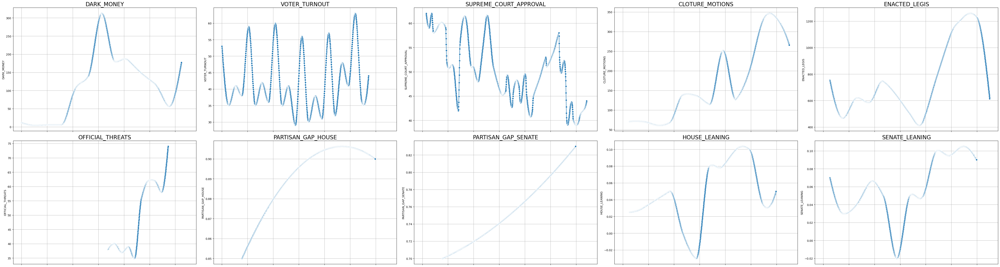

In [77]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 4*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

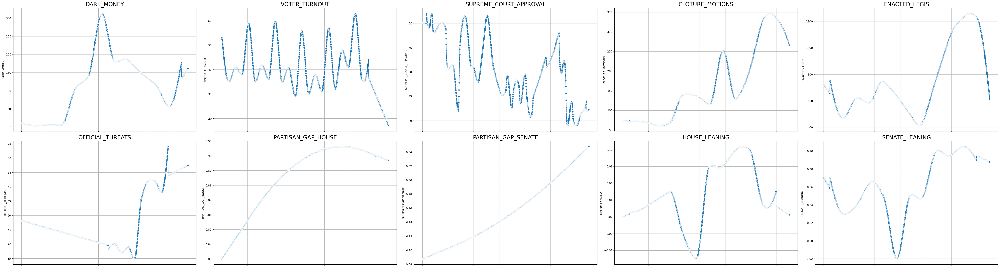

In [78]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 4*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [79]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT4_Interpolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT4_Interpolated.xlsx


### CLIENT 5: EDUCATION

In [80]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT5_EDUCATION', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  PUBLIC_TUITION  PRIVATE_TUITION  COLLEGE_ENROLL  \
0  Week-1-Jan-2000          3349.0          14616.0      15312289.0   
1  Week-2-Jan-2000             NaN              NaN             NaN   
2  Week-3-Jan-2000             NaN              NaN             NaN   
3  Week-4-Jan-2000             NaN              NaN             NaN   
4  Week-1-Feb-2000             NaN              NaN             NaN   

   LOAN_DEBT  READING_PROF  MATH_PROF  
0        NaN          32.5       26.0  
1        NaN           NaN        NaN  
2        NaN           NaN        NaN  
3        NaN           NaN        NaN  
4        NaN           NaN        NaN  


In [81]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  PUBLIC_TUITION  PRIVATE_TUITION  COLLEGE_ENROLL  LOAN_DEBT  \
0 2000-01-01          3349.0          14616.0      15312289.0        NaN   
1 2000-01-02             NaN              NaN             NaN        NaN   
2 2000-01-03             NaN              NaN             NaN        NaN   
3 2000-01-04             NaN              NaN             NaN        NaN   
4 2000-02-01             NaN              NaN             NaN        NaN   

   READING_PROF  MATH_PROF  
0          32.5       26.0  
1           NaN        NaN  
2           NaN        NaN  
3           NaN        NaN  
4           NaN        NaN  


In [82]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both')

# Display the first few rows after interpolation
print(df_interpolated.head())

   PUBLIC_TUITION  PRIVATE_TUITION  COLLEGE_ENROLL  LOAN_DEBT  READING_PROF  \
0     3349.000000     14616.000000    1.531229e+07        NaN     32.500000   
1     3351.149310     14633.487606    1.532350e+07        NaN     32.516760   
2     3353.328048     14650.931280    1.533475e+07        NaN     32.533386   
3     3355.536267     14668.331153    1.534604e+07        NaN     32.549874   
4     3357.774023     14685.687356    1.535737e+07        NaN     32.566221   

   MATH_PROF  
0  26.000000  
1  26.024008  
2  26.047954  
3  26.071838  
4  26.095661  


In [83]:
nan_columns = df_interpolated.columns[df_interpolated.isna().any()]
print(nan_columns)

Index(['PUBLIC_TUITION', 'PRIVATE_TUITION', 'COLLEGE_ENROLL', 'LOAN_DEBT',
       'READING_PROF', 'MATH_PROF'],
      dtype='object')


In [84]:
# Function to perform linear regression extrapolation
def linear_extrapolate(col):
    col = col.copy()
    n = len(col)

    # Find first and last 156 non-null values
    first_156 = col.dropna().iloc[:156]
    last_156 = col.dropna().iloc[-156:]

    # Fit linear regression for beginning extrapolation
    if len(first_156) >= 2:  # Need at least two points for regression
        X_first = first_156.index.values.reshape(-1, 1)
        y_first = first_156.values
        model_first = LinearRegression().fit(X_first, y_first)
        missing_first_indices = np.arange(0, first_156.index[0]).reshape(-1, 1)
        if len(missing_first_indices) > 0:
            col.iloc[:first_156.index[0]] = model_first.predict(missing_first_indices)

    # Fit linear regression for ending extrapolation
    if len(last_156) >= 2:
        X_last = last_156.index.values.reshape(-1, 1)
        y_last = last_156.values
        model_last = LinearRegression().fit(X_last, y_last)
        missing_last_indices = np.arange(last_156.index[-1] + 1, n).reshape(-1, 1)
        if len(missing_last_indices) > 0:
            col.iloc[last_156.index[-1] + 1:] = model_last.predict(missing_last_indices)

    return col

# Apply linear extrapolation where Akima could not extrapolate
df_extrapolated = df_interpolated.apply(linear_extrapolate)

# Display the first few rows after filling missing values
print(df_extrapolated.head())

   PUBLIC_TUITION  PRIVATE_TUITION  COLLEGE_ENROLL  LOAN_DEBT  READING_PROF  \
0     3349.000000     14616.000000    1.531229e+07  -0.091712     32.500000   
1     3351.149310     14633.487606    1.532350e+07  -0.090062     32.516760   
2     3353.328048     14650.931280    1.533475e+07  -0.088413     32.533386   
3     3355.536267     14668.331153    1.534604e+07  -0.086763     32.549874   
4     3357.774023     14685.687356    1.535737e+07  -0.085113     32.566221   

   MATH_PROF  
0  26.000000  
1  26.024008  
2  26.047954  
3  26.071838  
4  26.095661  


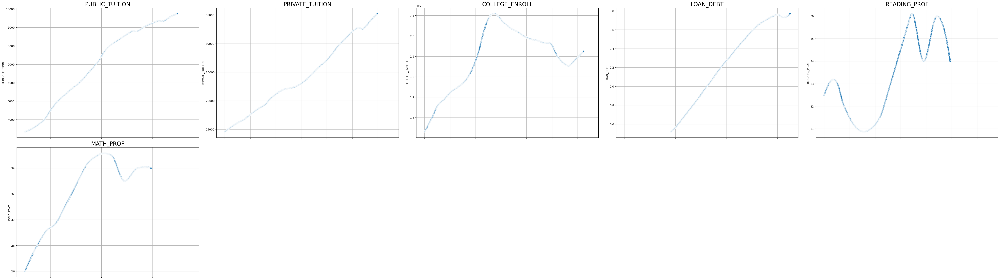

In [85]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

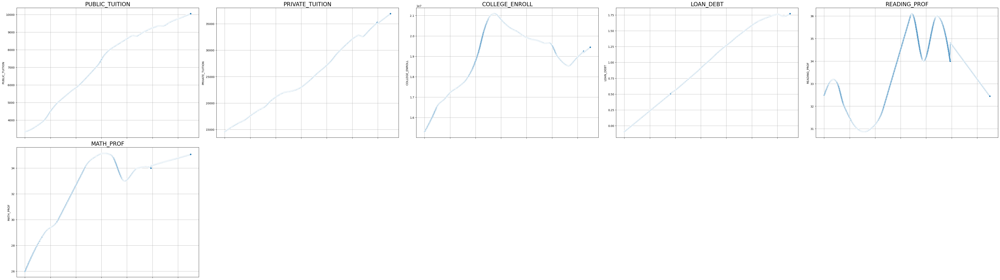

In [86]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [87]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT5_Interpolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT5_Interpolated.xlsx


### CLIENT 6: ENVIRONMENT

In [88]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT6_ENVIRONMENT', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  OIL_PROD  NATGAS_PROD  RENEW_PROD  PETROL_CONSUMP  \
0  Week-1-Jan-2000     12.45        19.34         4.2           37.73   
1  Week-2-Jan-2000       NaN          NaN         NaN             NaN   
2  Week-3-Jan-2000       NaN          NaN         NaN             NaN   
3  Week-4-Jan-2000       NaN          NaN         NaN             NaN   
4  Week-1-Feb-2000       NaN          NaN         NaN             NaN   

   NATGAS_CONSUMP  RENEW_CONSUMP  EMISSIONS  HYBRID_VEHICLES  \
0           22.91            4.2       7.37           9350.0   
1             NaN            NaN        NaN              NaN   
2             NaN            NaN        NaN              NaN   
3             NaN            NaN        NaN              NaN   
4             NaN            NaN        NaN              NaN   

   ELECTRIC_VEHICLES  FEMA_SPENDING  NATURAL_DISASTERS  SURFACE_TEMP  
0                0.0         0.8607                5.0          1.86  
1                NaN            Na

In [89]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  OIL_PROD  NATGAS_PROD  RENEW_PROD  PETROL_CONSUMP  \
0 2000-01-01     12.45        19.34         4.2           37.73   
1 2000-01-02       NaN          NaN         NaN             NaN   
2 2000-01-03       NaN          NaN         NaN             NaN   
3 2000-01-04       NaN          NaN         NaN             NaN   
4 2000-02-01       NaN          NaN         NaN             NaN   

   NATGAS_CONSUMP  RENEW_CONSUMP  EMISSIONS  HYBRID_VEHICLES  \
0           22.91            4.2       7.37           9350.0   
1             NaN            NaN        NaN              NaN   
2             NaN            NaN        NaN              NaN   
3             NaN            NaN        NaN              NaN   
4             NaN            NaN        NaN              NaN   

   ELECTRIC_VEHICLES  FEMA_SPENDING  NATURAL_DISASTERS  SURFACE_TEMP  
0                0.0         0.8607                5.0          1.86  
1                NaN            NaN                NaN           NaN  

In [90]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both')

# Display the first few rows after interpolation
print(df_interpolated.head())

    OIL_PROD  NATGAS_PROD  RENEW_PROD  PETROL_CONSUMP  NATGAS_CONSUMP  \
0  12.450000    19.340000    4.200000       37.730000       22.910000   
1  12.448176    19.344388    4.202293       37.742754       22.946000   
2  12.446358    19.348895    4.204366       37.755435       22.981306   
3  12.444545    19.353519    4.206221       37.768037       23.015916   
4  12.442738    19.358256    4.207862       37.780552       23.049828   

   RENEW_CONSUMP  EMISSIONS  HYBRID_VEHICLES  ELECTRIC_VEHICLES  \
0       4.200000   7.370000      9350.000000                0.0   
1       4.202674   7.366161      9514.643257                0.0   
2       4.205121   7.362338      9680.962127                0.0   
3       4.207343   7.358533      9848.963339                0.0   
4       4.209345   7.354749     10018.653620                0.0   

   FEMA_SPENDING  NATURAL_DISASTERS  SURFACE_TEMP  
0       0.860700           5.000000      1.860000  
1       0.874704           4.913997      1.838543  
2 

In [91]:
nan_columns = df_interpolated.columns[df_interpolated.isna().any()]
print(nan_columns)

Index(['OIL_PROD', 'NATGAS_PROD', 'RENEW_PROD', 'PETROL_CONSUMP',
       'NATGAS_CONSUMP', 'RENEW_CONSUMP', 'EMISSIONS', 'HYBRID_VEHICLES',
       'ELECTRIC_VEHICLES', 'FEMA_SPENDING', 'NATURAL_DISASTERS',
       'SURFACE_TEMP'],
      dtype='object')


In [92]:
# Function to perform linear regression extrapolation
def linear_extrapolate(col):
    col = col.copy()
    n = len(col)

    # Find first and last 156 non-null values
    first_156 = col.dropna().iloc[:156]
    last_156 = col.dropna().iloc[-156:]

    # Fit linear regression for beginning extrapolation
    if len(first_156) >= 2:  # Need at least two points for regression
        X_first = first_156.index.values.reshape(-1, 1)
        y_first = first_156.values
        model_first = LinearRegression().fit(X_first, y_first)
        missing_first_indices = np.arange(0, first_156.index[0]).reshape(-1, 1)
        if len(missing_first_indices) > 0:
            col.iloc[:first_156.index[0]] = model_first.predict(missing_first_indices)

    # Fit linear regression for ending extrapolation
    if len(last_156) >= 2:
        X_last = last_156.index.values.reshape(-1, 1)
        y_last = last_156.values
        model_last = LinearRegression().fit(X_last, y_last)
        missing_last_indices = np.arange(last_156.index[-1] + 1, n).reshape(-1, 1)
        if len(missing_last_indices) > 0:
            col.iloc[last_156.index[-1] + 1:] = model_last.predict(missing_last_indices)

    return col

# Apply linear extrapolation where Akima could not extrapolate
df_extrapolated = df_interpolated.apply(linear_extrapolate)

# Display the first few rows after filling missing values
print(df_extrapolated.head())

    OIL_PROD  NATGAS_PROD  RENEW_PROD  PETROL_CONSUMP  NATGAS_CONSUMP  \
0  12.450000    19.340000    4.200000       37.730000       22.910000   
1  12.448176    19.344388    4.202293       37.742754       22.946000   
2  12.446358    19.348895    4.204366       37.755435       22.981306   
3  12.444545    19.353519    4.206221       37.768037       23.015916   
4  12.442738    19.358256    4.207862       37.780552       23.049828   

   RENEW_CONSUMP  EMISSIONS  HYBRID_VEHICLES  ELECTRIC_VEHICLES  \
0       4.200000   7.370000      9350.000000                0.0   
1       4.202674   7.366161      9514.643257                0.0   
2       4.205121   7.362338      9680.962127                0.0   
3       4.207343   7.358533      9848.963339                0.0   
4       4.209345   7.354749     10018.653620                0.0   

   FEMA_SPENDING  NATURAL_DISASTERS  SURFACE_TEMP  
0       0.860700           5.000000      1.860000  
1       0.874704           4.913997      1.838543  
2 

In [96]:
print(df_extrapolated.tail())

       OIL_PROD  NATGAS_PROD  RENEW_PROD  PETROL_CONSUMP  NATGAS_CONSUMP  \
1295  27.181356    40.566591    8.966140       36.812075       34.878350   
1296  27.203995    40.596341    8.973655       36.828068       34.896869   
1297  27.226635    40.626090    8.981170       36.844061       34.915388   
1298  27.249275    40.655839    8.988685       36.860054       34.933907   
1299  27.271914    40.685589    8.996200       36.876047       34.952426   

      RENEW_CONSUMP  EMISSIONS  HYBRID_VEHICLES  ELECTRIC_VEHICLES  \
1295       8.716445   4.820473     1.101708e+06      560799.383624   
1296       8.723472   4.814919     1.103982e+06      561866.808134   
1297       8.730500   4.809365     1.106257e+06      562934.232644   
1298       8.737528   4.803810     1.108532e+06      564001.657154   
1299       8.744555   4.798256     1.110806e+06      565069.081664   

      FEMA_SPENDING  NATURAL_DISASTERS  SURFACE_TEMP  
1295      -1.724791          28.929382      1.158329  
1296      -1

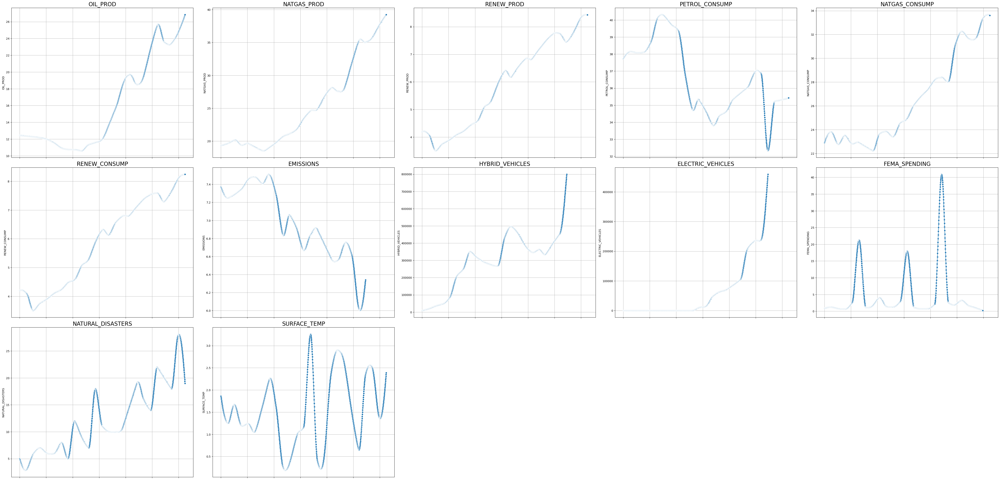

In [94]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 4*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

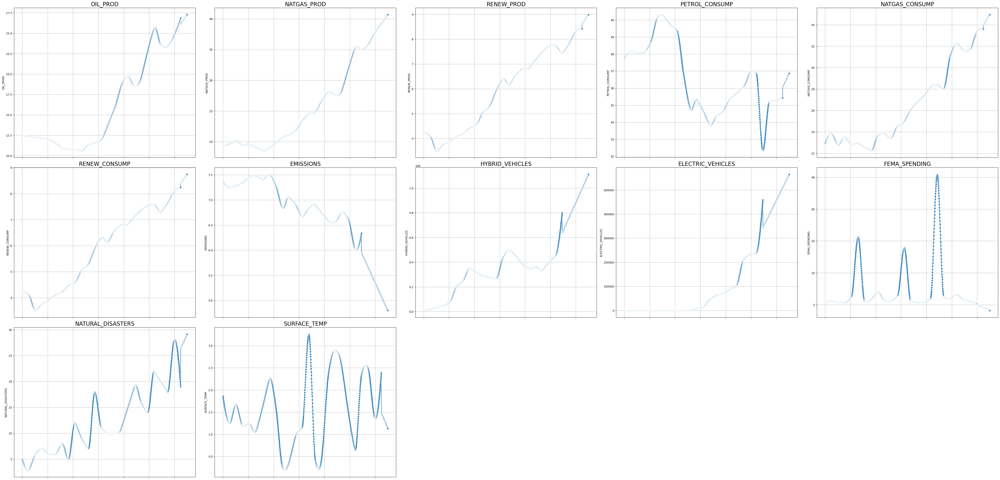

In [95]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 4*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [97]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT6_Interpolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT6_Interpolated.xlsx


### CLIENT 7: IMMIGRATION

In [110]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT7_IMMIGRATION', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  BORDER_ENCOUNTERS  IMMIGRANT_POP  UNDOCUMENTED_POP  \
0  Week-1-Jan-2000                NaN     31107889.0         8460000.0   
1  Week-2-Jan-2000                NaN            NaN               NaN   
2  Week-3-Jan-2000                NaN            NaN               NaN   
3  Week-4-Jan-2000                NaN            NaN               NaN   
4  Week-1-Feb-2000                NaN            NaN               NaN   

   BORDER_SPENDING  DEPORTATIONS  ASYLUM_APPS  
0              6.9           NaN          NaN  
1              NaN           NaN          NaN  
2              NaN           NaN          NaN  
3              NaN           NaN          NaN  
4              NaN           NaN          NaN  


In [111]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  BORDER_ENCOUNTERS  IMMIGRANT_POP  UNDOCUMENTED_POP  \
0 2000-01-01                NaN     31107889.0         8460000.0   
1 2000-01-02                NaN            NaN               NaN   
2 2000-01-03                NaN            NaN               NaN   
3 2000-01-04                NaN            NaN               NaN   
4 2000-02-01                NaN            NaN               NaN   

   BORDER_SPENDING  DEPORTATIONS  ASYLUM_APPS  
0              6.9           NaN          NaN  
1              NaN           NaN          NaN  
2              NaN           NaN          NaN  
3              NaN           NaN          NaN  
4              NaN           NaN          NaN  


In [112]:
# Set index 0 of ASYLUM_APPS to 0
df.loc[0, ['ASYLUM_APPS']] = 0

In [113]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both').clip(lower=0)

# Display the first few rows after interpolation
print(df_interpolated.head())

   BORDER_ENCOUNTERS  IMMIGRANT_POP  UNDOCUMENTED_POP  BORDER_SPENDING  \
0                NaN   3.110789e+07      8.460000e+06         6.900000   
1                NaN   3.111650e+07      8.463841e+06         6.869708   
2                NaN   3.112519e+07      8.467710e+06         6.840563   
3                NaN   3.113397e+07      8.471607e+06         6.812561   
4                NaN   3.114282e+07      8.475532e+06         6.785700   

   DEPORTATIONS  ASYLUM_APPS  
0           NaN          0.0  
1           NaN          0.0  
2           NaN          0.0  
3           NaN          0.0  
4           NaN          0.0  


In [114]:
nan_columns = df_interpolated.columns[df_interpolated.isna().any()]
print(nan_columns)

Index(['BORDER_ENCOUNTERS', 'IMMIGRANT_POP', 'UNDOCUMENTED_POP',
       'BORDER_SPENDING', 'DEPORTATIONS', 'ASYLUM_APPS'],
      dtype='object')


In [115]:
# Function to perform linear regression extrapolation
def linear_extrapolate(col):
    col = col.copy()
    n = len(col)

    # Find first and last 156 non-null values
    first_156 = col.dropna().iloc[:156]
    last_156 = col.dropna().iloc[-156:]

    # Fit linear regression for beginning extrapolation
    if len(first_156) >= 2:  # Need at least two points for regression
        X_first = first_156.index.values.reshape(-1, 1)
        y_first = first_156.values
        model_first = LinearRegression().fit(X_first, y_first)
        missing_first_indices = np.arange(0, first_156.index[0]).reshape(-1, 1)
        if len(missing_first_indices) > 0:
            col.iloc[:first_156.index[0]] = model_first.predict(missing_first_indices)

    # Fit linear regression for ending extrapolation
    if len(last_156) >= 2:
        X_last = last_156.index.values.reshape(-1, 1)
        y_last = last_156.values
        model_last = LinearRegression().fit(X_last, y_last)
        missing_last_indices = np.arange(last_156.index[-1] + 1, n).reshape(-1, 1)
        if len(missing_last_indices) > 0:
            col.iloc[last_156.index[-1] + 1:] = model_last.predict(missing_last_indices)

    return col

# Apply linear extrapolation where Akima could not extrapolate
df_extrapolated = df_interpolated.apply(linear_extrapolate)

# Display the first few rows after filling missing values
print(df_extrapolated.head())

   BORDER_ENCOUNTERS  IMMIGRANT_POP  UNDOCUMENTED_POP  BORDER_SPENDING  \
0         101.483330   3.110789e+07      8.460000e+06         6.900000   
1         101.346422   3.111650e+07      8.463841e+06         6.869708   
2         101.209514   3.112519e+07      8.467710e+06         6.840563   
3         101.072606   3.113397e+07      8.471607e+06         6.812561   
4         100.935698   3.114282e+07      8.475532e+06         6.785700   

   DEPORTATIONS  ASYLUM_APPS  
0    112.419424          0.0  
1    112.328598          0.0  
2    112.237772          0.0  
3    112.146946          0.0  
4    112.056120          0.0  


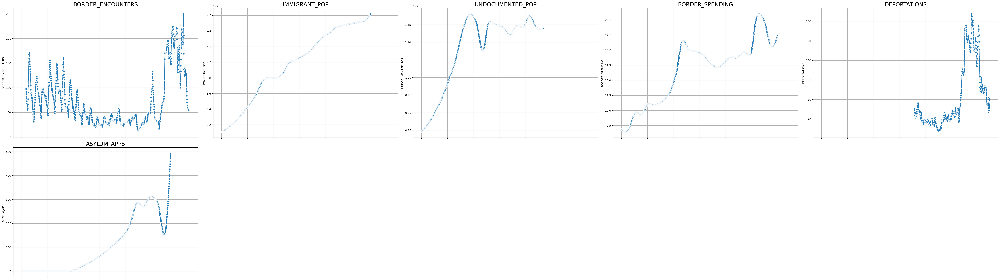

In [116]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

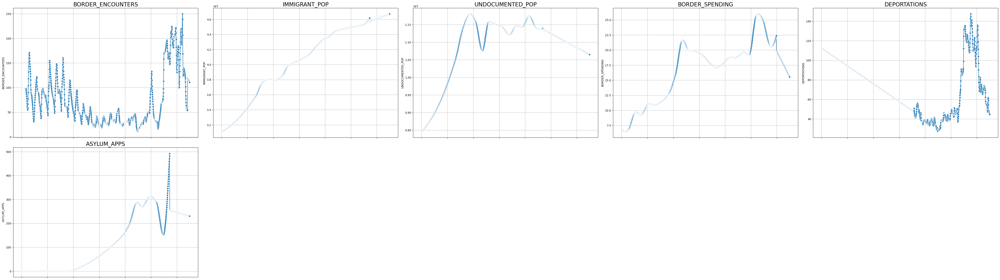

In [117]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [118]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT7_Interpolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT7_Interpolated.xlsx


### CLIENT 8: POPULATION

In [119]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT8_POPULATION', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  LGBTQ_IDENTITY  HOMELESS_POP  FERTILITY_RATE  \
0  Week-1-Jan-2000             NaN           NaN            65.9   
1  Week-2-Jan-2000             NaN           NaN             NaN   
2  Week-3-Jan-2000             NaN           NaN             NaN   
3  Week-4-Jan-2000             NaN           NaN             NaN   
4  Week-1-Feb-2000             NaN           NaN             NaN   

   USA_POPULATION  WHITE_POP  HISPANIC_POP  BLACK_POP  AAPI_POP  \
0     282171936.0       69.4          12.6       12.2       3.8   
1             NaN        NaN           NaN        NaN       NaN   
2             NaN        NaN           NaN        NaN       NaN   
3             NaN        NaN           NaN        NaN       NaN   
4             NaN        NaN           NaN        NaN       NaN   

   CHRISTIAN_POP  NON_RELIGIOUS_POP  
0           86.0                8.0  
1            NaN                NaN  
2            NaN                NaN  
3            NaN                NaN 

In [120]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  LGBTQ_IDENTITY  HOMELESS_POP  FERTILITY_RATE  USA_POPULATION  \
0 2000-01-01             NaN           NaN            65.9     282171936.0   
1 2000-01-02             NaN           NaN             NaN             NaN   
2 2000-01-03             NaN           NaN             NaN             NaN   
3 2000-01-04             NaN           NaN             NaN             NaN   
4 2000-02-01             NaN           NaN             NaN             NaN   

   WHITE_POP  HISPANIC_POP  BLACK_POP  AAPI_POP  CHRISTIAN_POP  \
0       69.4          12.6       12.2       3.8           86.0   
1        NaN           NaN        NaN       NaN            NaN   
2        NaN           NaN        NaN       NaN            NaN   
3        NaN           NaN        NaN       NaN            NaN   
4        NaN           NaN        NaN       NaN            NaN   

   NON_RELIGIOUS_POP  
0                8.0  
1                NaN  
2                NaN  
3                NaN  
4                Na

In [121]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both')

# Display the first few rows after interpolation
print(df_interpolated.head())

   LGBTQ_IDENTITY  HOMELESS_POP  FERTILITY_RATE  USA_POPULATION  WHITE_POP  \
0             NaN           NaN       65.900000    2.821719e+08  69.400000   
1             NaN           NaN       65.878047    2.822270e+08  69.388462   
2             NaN           NaN       65.856418    2.822821e+08  69.376923   
3             NaN           NaN       65.835108    2.823371e+08  69.365385   
4             NaN           NaN       65.814113    2.823920e+08  69.353846   

   HISPANIC_POP  BLACK_POP  AAPI_POP  CHRISTIAN_POP  NON_RELIGIOUS_POP  
0     12.600000       12.2  3.800000      86.000000           8.000000  
1     12.607692       12.2  3.804807      86.018982           7.981139  
2     12.615385       12.2  3.809613      86.037456           7.963018  
3     12.623077       12.2  3.814413      86.055409           7.945636  
4     12.630769       12.2  3.819208      86.072827           7.928994  


In [122]:
nan_columns = df_interpolated.columns[df_interpolated.isna().any()]
print(nan_columns)

Index(['LGBTQ_IDENTITY', 'HOMELESS_POP', 'FERTILITY_RATE', 'USA_POPULATION',
       'WHITE_POP', 'HISPANIC_POP', 'BLACK_POP', 'AAPI_POP', 'CHRISTIAN_POP',
       'NON_RELIGIOUS_POP'],
      dtype='object')


In [123]:
# Function to perform linear regression extrapolation
def linear_extrapolate(col):
    col = col.copy()
    n = len(col)

    # Find first and last 156 non-null values
    first_156 = col.dropna().iloc[:156]
    last_156 = col.dropna().iloc[-156:]

    # Fit linear regression for beginning extrapolation
    if len(first_156) >= 2:  # Need at least two points for regression
        X_first = first_156.index.values.reshape(-1, 1)
        y_first = first_156.values
        model_first = LinearRegression().fit(X_first, y_first)
        missing_first_indices = np.arange(0, first_156.index[0]).reshape(-1, 1)
        if len(missing_first_indices) > 0:
            col.iloc[:first_156.index[0]] = model_first.predict(missing_first_indices)

    # Fit linear regression for ending extrapolation
    if len(last_156) >= 2:
        X_last = last_156.index.values.reshape(-1, 1)
        y_last = last_156.values
        model_last = LinearRegression().fit(X_last, y_last)
        missing_last_indices = np.arange(last_156.index[-1] + 1, n).reshape(-1, 1)
        if len(missing_last_indices) > 0:
            col.iloc[last_156.index[-1] + 1:] = model_last.predict(missing_last_indices)

    return col

# Apply linear extrapolation where Akima could not extrapolate
df_extrapolated = df_interpolated.apply(linear_extrapolate)

# Display the first few rows after filling missing values
print(df_extrapolated.head())

   LGBTQ_IDENTITY   HOMELESS_POP  FERTILITY_RATE  USA_POPULATION  WHITE_POP  \
0        1.995042  678934.272272       65.900000    2.821719e+08  69.400000   
1        1.997420  678840.176513       65.878047    2.822270e+08  69.388462   
2        1.999797  678746.080755       65.856418    2.822821e+08  69.376923   
3        2.002174  678651.984996       65.835108    2.823371e+08  69.365385   
4        2.004551  678557.889238       65.814113    2.823920e+08  69.353846   

   HISPANIC_POP  BLACK_POP  AAPI_POP  CHRISTIAN_POP  NON_RELIGIOUS_POP  
0     12.600000       12.2  3.800000      86.000000           8.000000  
1     12.607692       12.2  3.804807      86.018982           7.981139  
2     12.615385       12.2  3.809613      86.037456           7.963018  
3     12.623077       12.2  3.814413      86.055409           7.945636  
4     12.630769       12.2  3.819208      86.072827           7.928994  


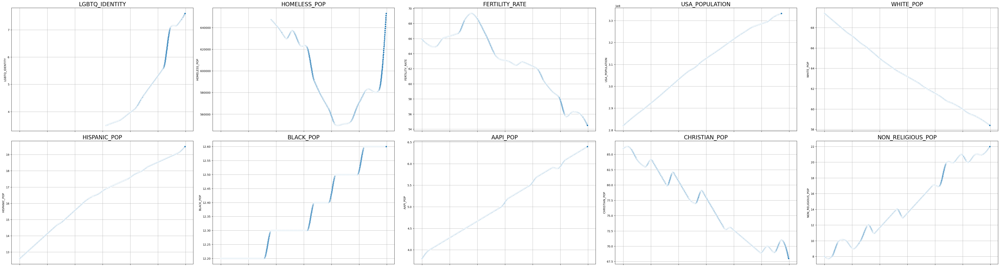

In [126]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 4*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

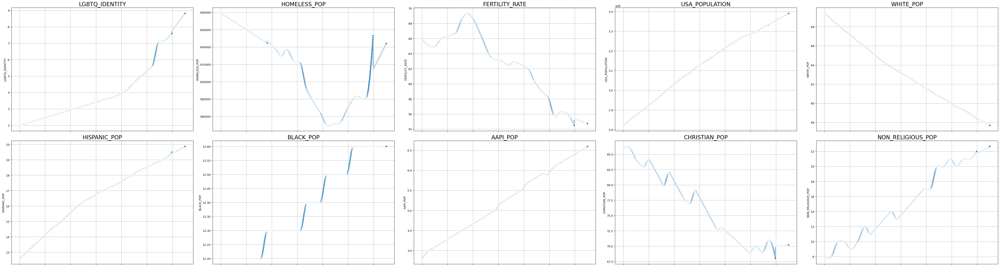

In [127]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 4*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [128]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT8_Interpolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT8_Interpolated.xlsx


### CLIENT 9: DEFENSE

In [129]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT9_DEFENSE', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  FOREIGN_AID  MIL_APPLICANTS  GLOBAL_INVOLVE_OPINION  \
0  Week-1-Jan-2000         30.3        365348.0                     NaN   
1  Week-2-Jan-2000          NaN             NaN                     NaN   
2  Week-3-Jan-2000          NaN             NaN                     NaN   
3  Week-4-Jan-2000          NaN             NaN                     NaN   
4  Week-1-Feb-2000          NaN             NaN                     NaN   

   MIL_DEATHS  
0       832.0  
1         NaN  
2         NaN  
3         NaN  
4         NaN  


In [130]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  FOREIGN_AID  MIL_APPLICANTS  GLOBAL_INVOLVE_OPINION  MIL_DEATHS
0 2000-01-01         30.3        365348.0                     NaN       832.0
1 2000-01-02          NaN             NaN                     NaN         NaN
2 2000-01-03          NaN             NaN                     NaN         NaN
3 2000-01-04          NaN             NaN                     NaN         NaN
4 2000-02-01          NaN             NaN                     NaN         NaN


In [131]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both')

# Display the first few rows after interpolation
print(df_interpolated.head())

   FOREIGN_AID  MIL_APPLICANTS  GLOBAL_INVOLVE_OPINION  MIL_DEATHS
0    30.300000   365348.000000                     NaN  832.000000
1    30.175723   365370.123097                     NaN  833.866742
2    30.054791   365396.424258                     NaN  835.736151
3    29.937170   365426.801288                     NaN  837.608154
4    29.822824   365461.151992                     NaN  839.482678


In [132]:
nan_columns = df_interpolated.columns[df_interpolated.isna().any()]
print(nan_columns)

Index(['FOREIGN_AID', 'MIL_APPLICANTS', 'GLOBAL_INVOLVE_OPINION',
       'MIL_DEATHS'],
      dtype='object')


In [133]:
# Function to perform linear regression extrapolation
def linear_extrapolate(col):
    col = col.copy()
    n = len(col)

    # Find first and last 156 non-null values
    first_156 = col.dropna().iloc[:156]
    last_156 = col.dropna().iloc[-156:]

    # Fit linear regression for beginning extrapolation
    if len(first_156) >= 2:  # Need at least two points for regression
        X_first = first_156.index.values.reshape(-1, 1)
        y_first = first_156.values
        model_first = LinearRegression().fit(X_first, y_first)
        missing_first_indices = np.arange(0, first_156.index[0]).reshape(-1, 1)
        if len(missing_first_indices) > 0:
            col.iloc[:first_156.index[0]] = model_first.predict(missing_first_indices)

    # Fit linear regression for ending extrapolation
    if len(last_156) >= 2:
        X_last = last_156.index.values.reshape(-1, 1)
        y_last = last_156.values
        model_last = LinearRegression().fit(X_last, y_last)
        missing_last_indices = np.arange(last_156.index[-1] + 1, n).reshape(-1, 1)
        if len(missing_last_indices) > 0:
            col.iloc[last_156.index[-1] + 1:] = model_last.predict(missing_last_indices)

    return col

# Apply linear extrapolation where Akima could not extrapolate
df_extrapolated = df_interpolated.apply(linear_extrapolate)

# Display the first few rows after filling missing values
print(df_extrapolated.head())

   FOREIGN_AID  MIL_APPLICANTS  GLOBAL_INVOLVE_OPINION  MIL_DEATHS
0    30.300000   365348.000000               76.094065  832.000000
1    30.175723   365370.123097               76.101936  833.866742
2    30.054791   365396.424258               76.109807  835.736151
3    29.937170   365426.801288               76.117678  837.608154
4    29.822824   365461.151992               76.125549  839.482678


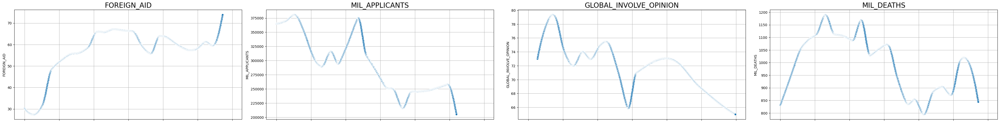

In [134]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

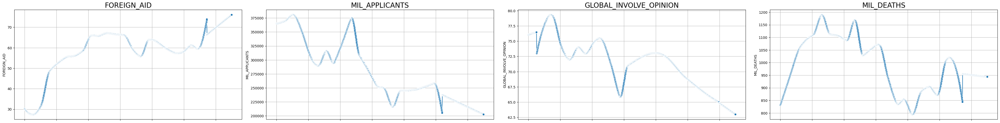

In [135]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [136]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT9_Interpolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT9_Interpolated.xlsx


### CLIENT 10: INFRASTRUCTURE

In [137]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT10_INFRASTRUCTURE', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  GOOD_BRIDGES  UNSATIS_ROADS
0  Week-1-Jan-2000           NaN          17.39
1  Week-2-Jan-2000           NaN            NaN
2  Week-3-Jan-2000           NaN            NaN
3  Week-4-Jan-2000           NaN            NaN
4  Week-1-Feb-2000           NaN            NaN


In [138]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  GOOD_BRIDGES  UNSATIS_ROADS
0 2000-01-01           NaN          17.39
1 2000-01-02           NaN            NaN
2 2000-01-03           NaN            NaN
3 2000-01-04           NaN            NaN
4 2000-02-01           NaN            NaN


In [139]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both')

# Display the first few rows after interpolation
print(df_interpolated.head())

   GOOD_BRIDGES  UNSATIS_ROADS
0           NaN      17.390000
1           NaN      17.383944
2           NaN      17.377701
3           NaN      17.371277
4           NaN      17.364674


In [140]:
nan_columns = df_interpolated.columns[df_interpolated.isna().any()]
print(nan_columns)

Index(['GOOD_BRIDGES', 'UNSATIS_ROADS'], dtype='object')


In [141]:
# Function to perform linear regression extrapolation
def linear_extrapolate(col):
    col = col.copy()
    n = len(col)

    # Find first and last 156 non-null values
    first_156 = col.dropna().iloc[:156]
    last_156 = col.dropna().iloc[-156:]

    # Fit linear regression for beginning extrapolation
    if len(first_156) >= 2:  # Need at least two points for regression
        X_first = first_156.index.values.reshape(-1, 1)
        y_first = first_156.values
        model_first = LinearRegression().fit(X_first, y_first)
        missing_first_indices = np.arange(0, first_156.index[0]).reshape(-1, 1)
        if len(missing_first_indices) > 0:
            col.iloc[:first_156.index[0]] = model_first.predict(missing_first_indices)

    # Fit linear regression for ending extrapolation
    if len(last_156) >= 2:
        X_last = last_156.index.values.reshape(-1, 1)
        y_last = last_156.values
        model_last = LinearRegression().fit(X_last, y_last)
        missing_last_indices = np.arange(last_156.index[-1] + 1, n).reshape(-1, 1)
        if len(missing_last_indices) > 0:
            col.iloc[last_156.index[-1] + 1:] = model_last.predict(missing_last_indices)

    return col

# Apply linear extrapolation where Akima could not extrapolate
df_extrapolated = df_interpolated.apply(linear_extrapolate)

# Display the first few rows after filling missing values
print(df_extrapolated.head())

   GOOD_BRIDGES  UNSATIS_ROADS
0     47.987830      17.390000
1     47.986751      17.383944
2     47.985673      17.377701
3     47.984595      17.371277
4     47.983517      17.364674


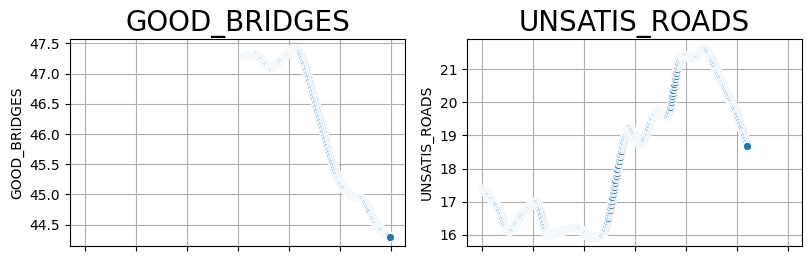

In [143]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(20, 7*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

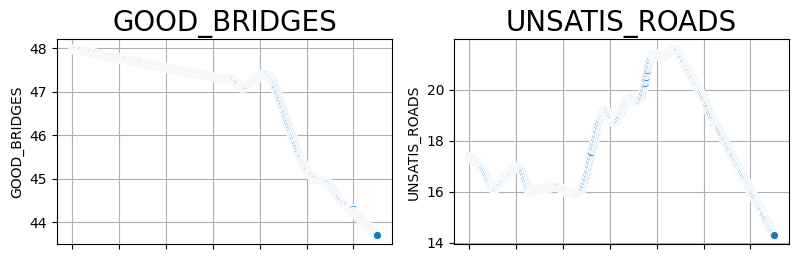

In [144]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(20, 7*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [145]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT10_Interpolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT10_Interpolated.xlsx


### CLIENT 11: CRIME

In [164]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT11_CRIME', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  ACTIVE_SHOOTERS  BACKGROUND_CHECKS  FIREARM_PROD  \
0  Week-1-Jan-2000              0.0          8543037.0     3793541.0   
1  Week-2-Jan-2000              NaN                NaN           NaN   
2  Week-3-Jan-2000              NaN                NaN           NaN   
3  Week-4-Jan-2000              NaN                NaN           NaN   
4  Week-1-Feb-2000              NaN                NaN           NaN   

   DOM_VIOLENCE_RATE  INCARCERATED_POP  HOMICIDE_RATE  DOM_TERROR_INCIDENTS  \
0                NaN             494.0            5.9                   NaN   
1                NaN               NaN            NaN                   NaN   
2                NaN               NaN            NaN                   NaN   
3                NaN               NaN            NaN                   NaN   
4                NaN               NaN            NaN                   NaN   

   DOM_TERROR_DEFENDANTS  FBI_INVESTIGATIONS  FBI_DISRUPTIONS  \
0                    NaN   

In [165]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  ACTIVE_SHOOTERS  BACKGROUND_CHECKS  FIREARM_PROD  \
0 2000-01-01              0.0          8543037.0     3793541.0   
1 2000-01-02              NaN                NaN           NaN   
2 2000-01-03              NaN                NaN           NaN   
3 2000-01-04              NaN                NaN           NaN   
4 2000-02-01              NaN                NaN           NaN   

   DOM_VIOLENCE_RATE  INCARCERATED_POP  HOMICIDE_RATE  DOM_TERROR_INCIDENTS  \
0                NaN             494.0            5.9                   NaN   
1                NaN               NaN            NaN                   NaN   
2                NaN               NaN            NaN                   NaN   
3                NaN               NaN            NaN                   NaN   
4                NaN               NaN            NaN                   NaN   

   DOM_TERROR_DEFENDANTS  FBI_INVESTIGATIONS  FBI_DISRUPTIONS  \
0                    NaN                 NaN              NaN  

In [166]:
# Set index 0 of the following columns to 0 as these columns' values cannot be negative
df.loc[0, ['DOM_TERROR_INCIDENTS','FBI_DISRUPTIONS','CYBERATTACKS','CYBERATTACK_LOSSES']] = 0

In [167]:
# To not have negative values in tail of BLACK_POLICE_INJURIES, find mean and impute at index where 2020 starts
mean_value = df['BLACK_POLICE_INJURIES'].mean()
print(mean_value)
df.loc[1041, ['BLACK_POLICE_INJURIES']] = mean_value

24773.30769230769


In [168]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both').clip(lower=0)

# Display the first few rows after interpolation
print(df_interpolated.head())

   ACTIVE_SHOOTERS  BACKGROUND_CHECKS  FIREARM_PROD  DOM_VIOLENCE_RATE  \
0         0.000000       8.543037e+06  3.793541e+06                NaN   
1         0.190743       8.557898e+06  3.764666e+06                NaN   
2         0.378364       8.572529e+06  3.736068e+06                NaN   
3         0.562871       8.586926e+06  3.707759e+06                NaN   
4         0.744277       8.601084e+06  3.679751e+06                NaN   

   INCARCERATED_POP  HOMICIDE_RATE  DOM_TERROR_INCIDENTS  \
0        494.000000       5.900000              0.000000   
1        493.895079       5.943974              0.092132   
2        493.791918       5.987421              0.183913   
3        493.690613       6.030325              0.275343   
4        493.591261       6.072667              0.366423   

   DOM_TERROR_DEFENDANTS  FBI_INVESTIGATIONS  FBI_DISRUPTIONS  \
0                    NaN                 NaN         0.000000   
1                    NaN                 NaN         0.829431   

In [169]:
nan_columns = df_interpolated.columns[df_interpolated.isna().any()]
print(nan_columns)

Index(['ACTIVE_SHOOTERS', 'BACKGROUND_CHECKS', 'FIREARM_PROD',
       'DOM_VIOLENCE_RATE', 'INCARCERATED_POP', 'HOMICIDE_RATE',
       'DOM_TERROR_INCIDENTS', 'DOM_TERROR_DEFENDANTS', 'FBI_INVESTIGATIONS',
       'FBI_DISRUPTIONS', 'CRIM_JUSTICE_OPINION', 'CYBERATTACKS',
       'CYBERATTACK_LOSSES', 'ANTIGOV_HATE_GROUPS', 'BLACK_POLICE_KILLINGS',
       'BLACK_POLICE_INJURIES'],
      dtype='object')


In [170]:
# Function to perform linear regression extrapolation
def linear_extrapolate(col):
    col = col.copy()
    n = len(col)

    # Find first and last 156 non-null values
    first_156 = col.dropna().iloc[:156]
    last_156 = col.dropna().iloc[-156:]

    # Fit linear regression for beginning extrapolation
    if len(first_156) >= 2:  # Need at least two points for regression
        X_first = first_156.index.values.reshape(-1, 1)
        y_first = first_156.values
        model_first = LinearRegression().fit(X_first, y_first)
        missing_first_indices = np.arange(0, first_156.index[0]).reshape(-1, 1)
        if len(missing_first_indices) > 0:
            col.iloc[:first_156.index[0]] = model_first.predict(missing_first_indices)

    # Fit linear regression for ending extrapolation
    if len(last_156) >= 2:
        X_last = last_156.index.values.reshape(-1, 1)
        y_last = last_156.values
        model_last = LinearRegression().fit(X_last, y_last)
        missing_last_indices = np.arange(last_156.index[-1] + 1, n).reshape(-1, 1)
        if len(missing_last_indices) > 0:
            col.iloc[last_156.index[-1] + 1:] = model_last.predict(missing_last_indices)

    return col

# Apply linear extrapolation where Akima could not extrapolate
df_extrapolated = df_interpolated.apply(linear_extrapolate)

# Display the first few rows after filling missing values
print(df_extrapolated.head())

   ACTIVE_SHOOTERS  BACKGROUND_CHECKS  FIREARM_PROD  DOM_VIOLENCE_RATE  \
0         0.000000       8.543037e+06  3.793541e+06           7.602321   
1         0.190743       8.557898e+06  3.764666e+06           7.597720   
2         0.378364       8.572529e+06  3.736068e+06           7.593119   
3         0.562871       8.586926e+06  3.707759e+06           7.588519   
4         0.744277       8.601084e+06  3.679751e+06           7.583918   

   INCARCERATED_POP  HOMICIDE_RATE  DOM_TERROR_INCIDENTS  \
0        494.000000       5.900000              0.000000   
1        493.895079       5.943974              0.092132   
2        493.791918       5.987421              0.183913   
3        493.690613       6.030325              0.275343   
4        493.591261       6.072667              0.366423   

   DOM_TERROR_DEFENDANTS  FBI_INVESTIGATIONS  FBI_DISRUPTIONS  \
0             201.030623         4023.839483         0.000000   
1             200.898713         4020.771988         0.829431   

In [171]:
print(df_extrapolated.tail())

      ACTIVE_SHOOTERS  BACKGROUND_CHECKS  FIREARM_PROD  DOM_VIOLENCE_RATE  \
1295        63.301892       6.824637e+07  1.912929e+06           5.957025   
1296        63.390130       6.836918e+07  1.894572e+06           5.960866   
1297        63.478367       6.849199e+07  1.876214e+06           5.964707   
1298        63.566605       6.861480e+07  1.857857e+06           5.968549   
1299        63.654842       6.873761e+07  1.839500e+06           5.972390   

      INCARCERATED_POP  HOMICIDE_RATE  DOM_TERROR_INCIDENTS  \
1295        186.393074      10.179311             40.495955   
1296        185.624850      10.190329             40.543120   
1297        184.856627      10.201347             40.590284   
1298        184.088404      10.212364             40.637449   
1299        183.320180      10.223382             40.684613   

      DOM_TERROR_DEFENDANTS  FBI_INVESTIGATIONS  FBI_DISRUPTIONS  \
1295             735.583914        14043.713663       614.401207   
1296             737.5

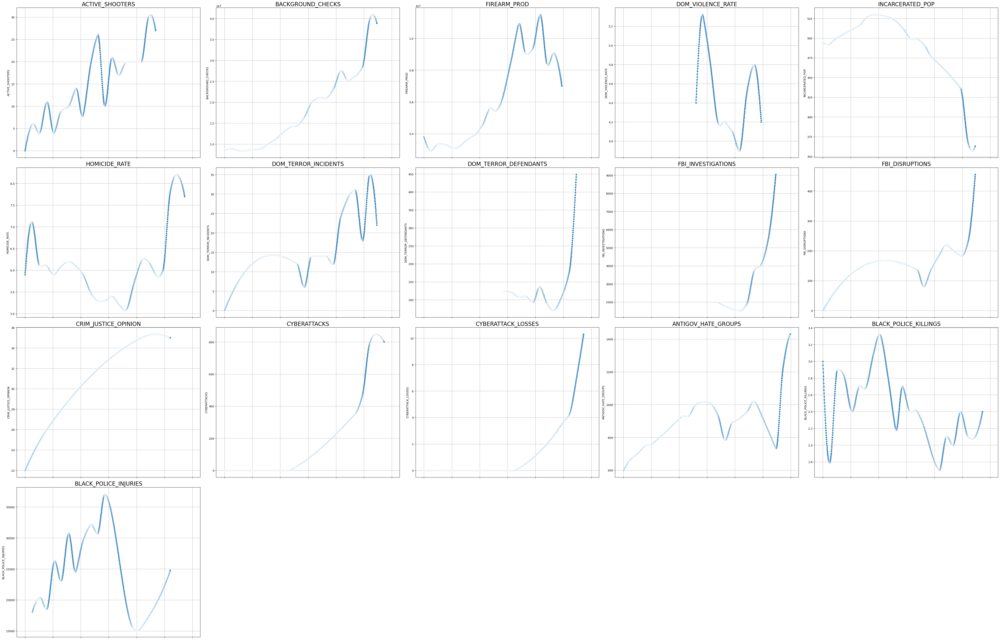

In [172]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 3*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

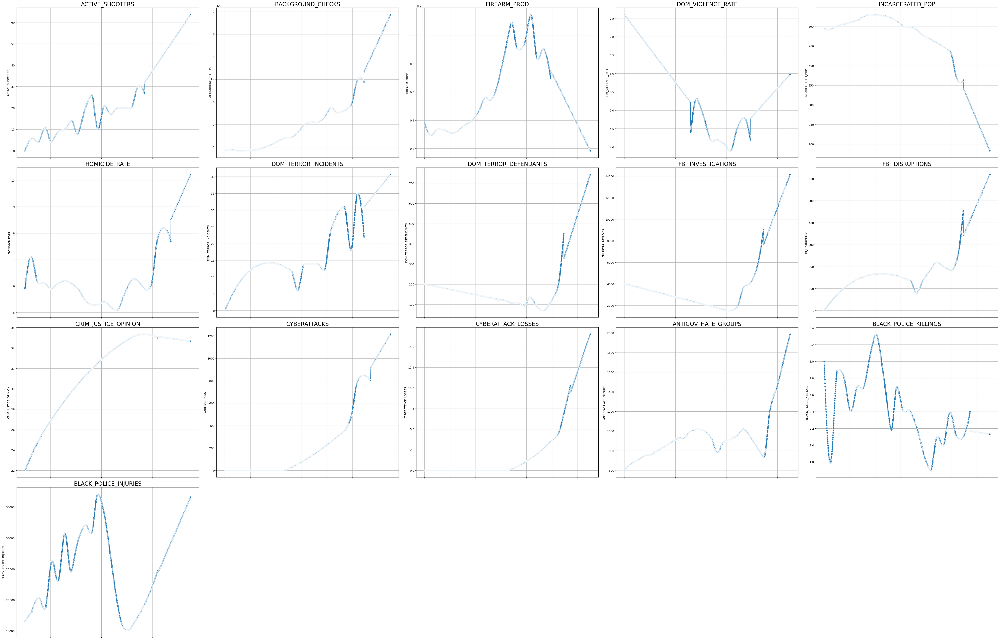

In [173]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 3*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [174]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT11_Interpolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT11_Interpolated.xlsx


### CLIENT 12: AGRICULTURE

In [175]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='CLIENT12_AGRICULTURE', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  AGRI_SPENDING      FARMS  AGRI_SALES
0  Week-1-Jan-2000           2.08  2163739.6       322.2
1  Week-2-Jan-2000            NaN        NaN         NaN
2  Week-3-Jan-2000            NaN        NaN         NaN
3  Week-4-Jan-2000            NaN        NaN         NaN
4  Week-1-Feb-2000            NaN        NaN         NaN


In [176]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  AGRI_SPENDING      FARMS  AGRI_SALES
0 2000-01-01           2.08  2163739.6       322.2
1 2000-01-02            NaN        NaN         NaN
2 2000-01-03            NaN        NaN         NaN
3 2000-01-04            NaN        NaN         NaN
4 2000-02-01            NaN        NaN         NaN


In [177]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both')

# Display the first few rows after interpolation
print(df_interpolated.head())

   AGRI_SPENDING         FARMS  AGRI_SALES
0       2.080000  2.163740e+06  322.200000
1       2.065147  2.163096e+06  322.490353
2       2.050398  2.162458e+06  322.771126
3       2.035752  2.161826e+06  323.042470
4       2.021211  2.161201e+06  323.304534


In [178]:
nan_columns = df_interpolated.columns[df_interpolated.isna().any()]
print(nan_columns)

Index(['AGRI_SPENDING', 'FARMS', 'AGRI_SALES'], dtype='object')


In [179]:
# Function to perform linear regression extrapolation
def linear_extrapolate(col):
    col = col.copy()
    n = len(col)

    # Find first and last 156 non-null values
    first_156 = col.dropna().iloc[:156]
    last_156 = col.dropna().iloc[-156:]

    # Fit linear regression for beginning extrapolation
    if len(first_156) >= 2:  # Need at least two points for regression
        X_first = first_156.index.values.reshape(-1, 1)
        y_first = first_156.values
        model_first = LinearRegression().fit(X_first, y_first)
        missing_first_indices = np.arange(0, first_156.index[0]).reshape(-1, 1)
        if len(missing_first_indices) > 0:
            col.iloc[:first_156.index[0]] = model_first.predict(missing_first_indices)

    # Fit linear regression for ending extrapolation
    if len(last_156) >= 2:
        X_last = last_156.index.values.reshape(-1, 1)
        y_last = last_156.values
        model_last = LinearRegression().fit(X_last, y_last)
        missing_last_indices = np.arange(last_156.index[-1] + 1, n).reshape(-1, 1)
        if len(missing_last_indices) > 0:
            col.iloc[last_156.index[-1] + 1:] = model_last.predict(missing_last_indices)

    return col

# Apply linear extrapolation where Akima could not extrapolate
df_extrapolated = df_interpolated.apply(linear_extrapolate)

# Display the first few rows after filling missing values
print(df_extrapolated.head())

   AGRI_SPENDING         FARMS  AGRI_SALES
0       2.080000  2.163740e+06  322.200000
1       2.065147  2.163096e+06  322.490353
2       2.050398  2.162458e+06  322.771126
3       2.035752  2.161826e+06  323.042470
4       2.021211  2.161201e+06  323.304534


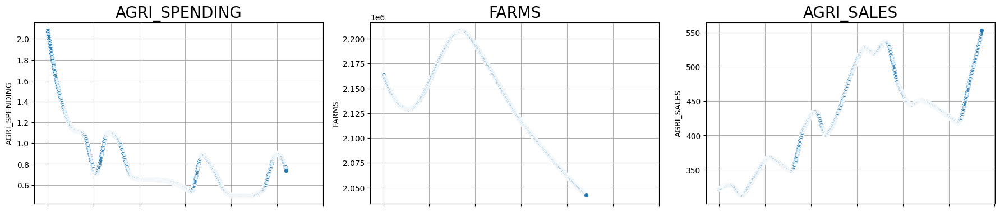

In [180]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(30, 7*len(df_interpolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_interpolated.columns):
    sns.lineplot(data=df_interpolated, x=df_interpolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_interpolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

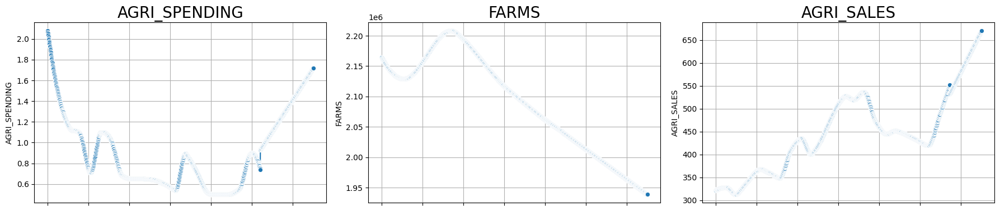

In [181]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(30, 7*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

In [182]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT12_Interpolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT12_Interpolated.xlsx


### GLOBAL OUTPUT

In [183]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='GLOBAL', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE  GOVT_SATISFACTION
0  Week-1-Jan-2000               69.0
1  Week-2-Jan-2000                NaN
2  Week-3-Jan-2000                NaN
3  Week-4-Jan-2000                NaN
4  Week-1-Feb-2000                NaN


In [184]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE  GOVT_SATISFACTION
0 2000-01-01               69.0
1 2000-01-02                NaN
2 2000-01-03                NaN
3 2000-01-04                NaN
4 2000-02-01                NaN


In [185]:
# Select numeric columns
df_numeric = df.select_dtypes(include=['number'])

# Interpolate missing values in numeric columns
df_interpolated = df_numeric.interpolate(method='akima', limit_direction='both')

# Display the first few rows after interpolation
print(df_interpolated.head())

   GOVT_SATISFACTION
0          69.000000
1          68.615525
2          68.174198
3          67.672741
4          67.107872


In [186]:
nan_columns = df_interpolated.columns[df_interpolated.isna().any()]
print(nan_columns)

Index([], dtype='object')


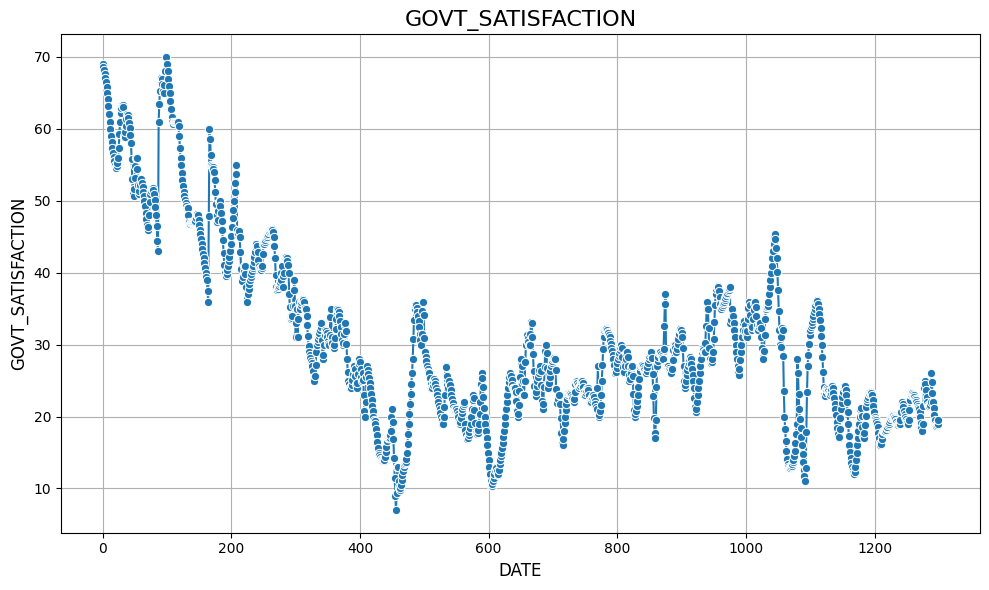

In [187]:
# Plot the global output 'GOVT_SATISFACTION' variable
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_interpolated, x=df_interpolated.index, y='GOVT_SATISFACTION', marker='o')

# Customize plot
plt.title('GOVT_SATISFACTION', fontsize=16)
plt.xlabel('DATE', fontsize=12)
plt.ylabel('GOVT_SATISFACTION', fontsize=12)
plt.grid(True)

plt.tight_layout()
plt.show()

In [188]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_GLOBAL.xlsx"

# Save DataFrame to Excel
df_interpolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_GLOBAL.xlsx


### LLM
Initial data analysis on word length

In [200]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_Revised_Dataset.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, sheet_name='LLM', engine='openpyxl')

# Display the first few rows
print(df.head())

              DATE                                        NEWS_EVENTS
0  Week-1-Jan-2000  Alan Greenspan is nominated for a fourth term ...
1  Week-2-Jan-2000  America Online announces an agreement to purch...
2  Week-3-Jan-2000  A dorm fire at Seton Hall University kills thr...
3  Week-4-Jan-2000  The rap-metal band Rage Against the Machine pl...
4  Week-1-Feb-2000                                                NaN


In [201]:
llm_counts = df['NEWS_EVENTS'].apply(lambda x: len(str(x).split()))
print(llm_counts.describe())

count    1300.000000
mean      103.886923
std       103.396203
min         1.000000
25%        27.750000
50%        70.500000
75%       150.000000
max       602.000000
Name: NEWS_EVENTS, dtype: float64


In [202]:
# Compute 90th, 95th, 97th, and 99th percentiles of word counts
percentile_90 = llm_counts.quantile(0.9)
print(f"90th Percentile of Word Length: {percentile_90}")
percentile_95 = llm_counts.quantile(0.95)
print(f"95th Percentile of Word Length: {percentile_95}")
percentile_97 = llm_counts.quantile(0.97)
print(f"97th Percentile of Word Length: {percentile_97}")
percentile_99 = llm_counts.quantile(0.99)
print(f"99th Percentile of Word Length: {percentile_99}")

90th Percentile of Word Length: 247.0
95th Percentile of Word Length: 318.0999999999999
97th Percentile of Word Length: 358.14999999999986
99th Percentile of Word Length: 455.03


Finally export DATE column as datetime

In [203]:
# Convert DATE column to datetime, ex: 2000-01-04 means Week 4 of January 2000, etc.
# Remove "Week-"
df['DATE'] = df['DATE'].str.replace('Week-', '', regex=False)

# Convert to datetime
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%b-%Y')

# Display results
print(df.head())

        DATE                                        NEWS_EVENTS
0 2000-01-01  Alan Greenspan is nominated for a fourth term ...
1 2000-01-02  America Online announces an agreement to purch...
2 2000-01-03  A dorm fire at Seton Hall University kills thr...
3 2000-01-04  The rap-metal band Rage Against the Machine pl...
4 2000-02-01                                                NaN


In [204]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_LLM_DATE.xlsx"

# Save DataFrame to Excel
df.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_LLM_DATE.xlsx


In [205]:
# End of code 2/24/25